In [1]:
import scanpy as sc
import numpy as np
import scvelo as scv
import cellrank as cr
import loompy as lp
import scipy.sparse as sp
from cellrank.kernels import RealTimeKernel
from moscot.problems.time import TemporalProblem
import IPython.display
import matplotlib_inline.backend_inline
IPython.display.set_matplotlib_formats = matplotlib_inline.backend_inline.set_matplotlib_formats
import matplotlib.pyplot as plt
import rpy2

cr.settings.verbosity = 2
#sc.settings.set_figure_params(frameon=False, dpi=500, figsize=(10,7), format='png')
plt.rcParams['axes.grid'] = False

In [2]:
# file with scvelo analysis
file = '/Users/rikac/Documents/mansfield_lab/bc3306_scvelo_analyzed_ver3_fixed.h5ad'

In [3]:
adata_velo = sc.read(file)

In [4]:
adata_velo

AnnData object with n_obs × n_vars = 10879 × 18973
    obs: 'sample', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'outlier', 'mt_outlier', 'doublet_scores', 'predicted_doublets', 'batch', 'leiden_0.01', 'leiden_0.025', 'leiden_0.05', 'leiden_0.1', 'leiden_0.15', 'leiden_0.2', 'leiden_0.4', 'ebf2+_sox9+_col2a1+', 'ebf2+_sox9+_col2a1-', 'leiden_0.6', 'cell_type'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std', 'gene_count_corr'
    uns: 'DGEleiden0.01', 'DGEleiden0.025', 'DGEleiden0.05', 'DGEleiden0.1', 'DGEleiden0.15', 'DGEleiden0.2', 'DGEleiden0.4', 'cell_type_colors', 'ebf2+_sox9+_col2a1+_colors', 'ebf2+_sox9+_col2a1-_colors', 'hvg', 'latent_time_categorical_colors', 'lei

## RealTimeKernel (experimental time)

In [5]:
adata_velo.obs['day'] = adata_velo.obs['sample'].replace({'JJ003': '13.5', 'JJ004': '12.5', 'JJ005': '11.5'})
# for plotting 
adata_velo.obs["day_numerical"] = adata_velo.obs["day"].astype(float)

In [6]:
tp = TemporalProblem(adata_velo)
tp = tp.score_genes_for_marginals(
    gene_set_proliferation="mouse", gene_set_apoptosis="mouse"
)

computing score 'proliferation'


    finished (0:00:00)
computing score 'apoptosis'
       'Il1a', 'Lif', 'Lrmp'],
      dtype='object')
    finished (0:00:00)


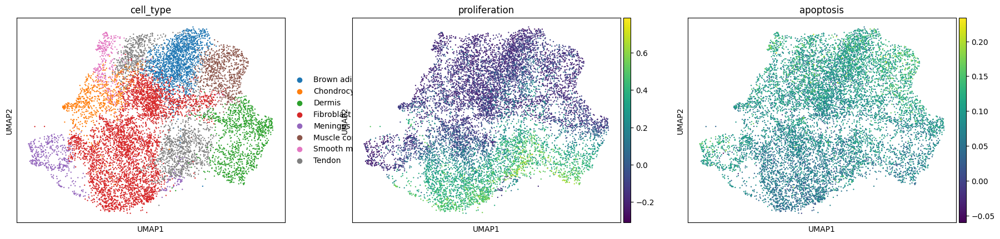

In [7]:
sc.pl.embedding(adata_velo, basis="umap", color=["cell_type", "proliferation", "apoptosis"])

In [8]:
tp = tp.prepare(time_key="day_numerical")

INFO     Computing pca with `n_comps=30` for `xy` using `adata.X`                                                  
computing PCA
    with n_comps=30
    finished (0:00:08)
INFO     Computing pca with `n_comps=30` for `xy` using `adata.X`                                                  
computing PCA
    with n_comps=30
    finished (0:00:11)


In [9]:
# solving inter-timepoints problem, should be only 2 (11.5-12.5 and 12.5-13.5)
# epsilon and tau controls entropic regularization and unbalancedness
tp = tp.solve(epsilon=1e-3, tau_a=0.95, scale_cost="mean")

INFO     Solving `2` problems                                                                                      
INFO     Solving problem BirthDeathProblem[stage='prepared', shape=(2777, 3179)].                                  
INFO     Solving problem BirthDeathProblem[stage='prepared', shape=(3179, 4923)].                                  


In [10]:
tmk = RealTimeKernel.from_moscot(tp)

In [11]:
# compute transition matrix for RealTimeKernel
tmk.compute_transition_matrix(self_transitions="all", conn_weight=0.2, threshold="auto")

100%|██████████| 2/2 [00:00<00:00, 15279.80time pair/s]

Using automatic `threshold=3.4050882773140057e-12`


RealTimeKernel[n=10879, threshold='auto', self_transitions='all']

Simulating `100` random walks of maximum length `500`


100%|██████████| 100/100 [00:09<00:00, 10.15sim/s]

    Finish (0:00:09)
Plotting random walks


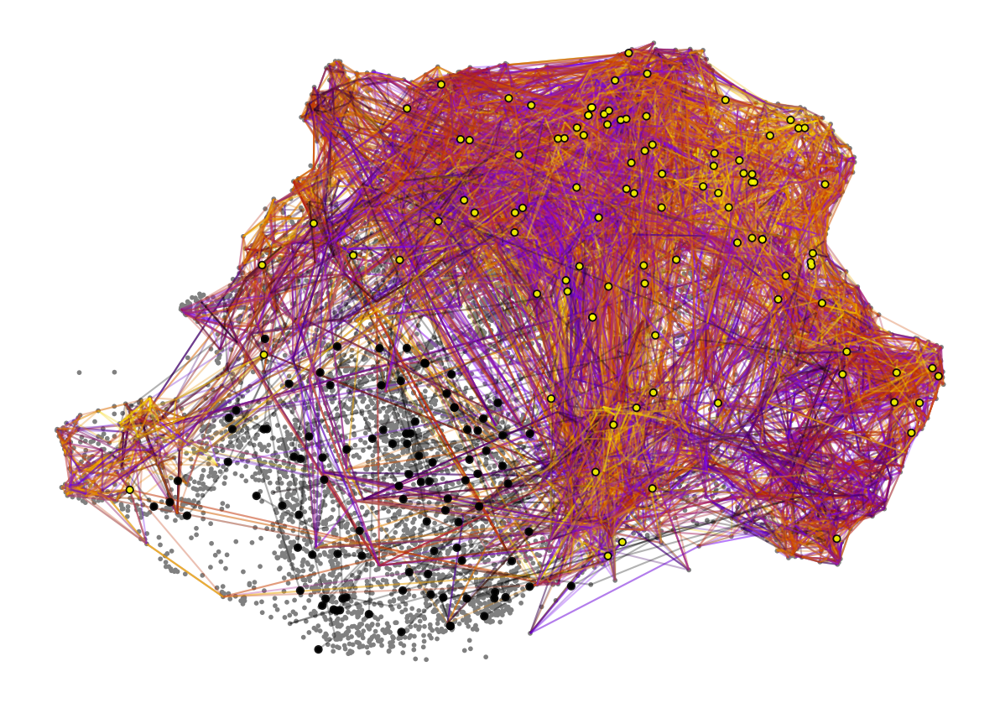

In [12]:
# visualize recovered dynamics
tmk.plot_random_walks(
    max_iter=500,
    start_ixs={"day_numerical": 11.5},
    basis="X_umap",
    seed=0,
    dpi=150,
    size=30,
    figsize=(10,7)
)

Computing flow from `Fibroblast progenitors` into `7` cluster(s) in `2` time points
Plotting flow from `Fibroblast progenitors` into `5` cluster(s) in `2` time points


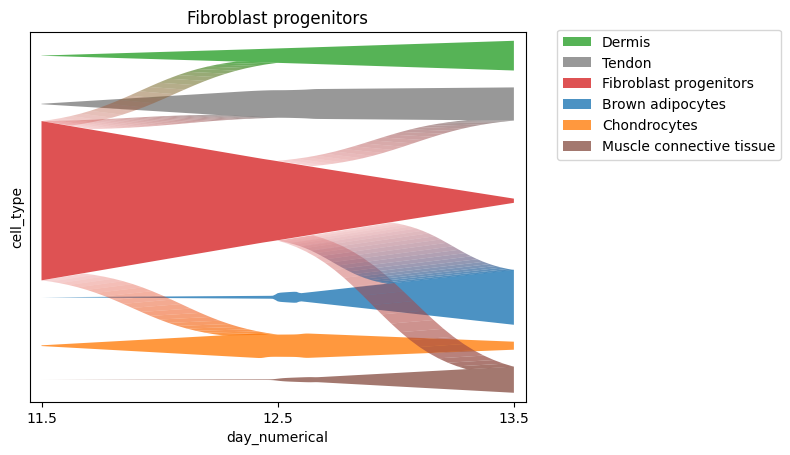

In [13]:
# probability mass flow graphs
ax = tmk.plot_single_flow(
    cluster_key="cell_type",
    time_key="day_numerical",
    cluster="Fibroblast progenitors",
    min_flow=0.1,
    xticks_step_size=1,
    show=False,
)

_ = ax.set_xticklabels(ax.get_xticklabels())

In [14]:
# identify initial and terminal states
g = cr.estimators.GPCCA(tmk)
print(g)

GPCCA[kernel=RealTimeKernel[n=10879], initial_states=None, terminal_states=None]


Computing Schur decomposition
Adding `adata.uns['eigendecomposition_fwd']`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:07:15)
Calculating minChi criterion in interval `[8, 10]`
Computing `8` macrostates
Adding `.macrostates`
       `.macrostates_memberships`
       `.coarse_T`
       `.coarse_initial_distribution
       `.coarse_stationary_distribution`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:10:28)


/opt/anaconda3/envs/single-cell/lib/python3.13/site-packages/scvelo/plotting/scatter.py:656: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  smp = ax.scatter(
/opt/anaconda3/envs/single-cell/lib/python3.13/site-packages/scvelo/plotting/scatter.py:694: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/opt/anaconda3/envs/single-cell/lib/python3.13/site-packages/scvelo/plotting/utils.py:1396: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(x, y, s=bg_size, marker=".", c=bg_color, zorder=zord - 2, **kwargs)
/opt/anaconda3/envs/single-cell/lib/python3.13/site-packages/scvelo/plotting/utils.py:1397: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(x, y, s=gp_size, marker=".", c=gp_color, zorder=zord - 1, **kwargs)


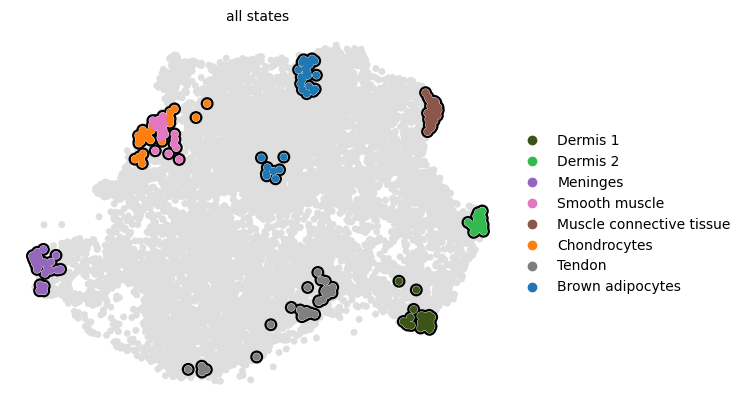

In [15]:
# macrostates
g.fit(cluster_key="cell_type", n_states=[8, 10])
g.plot_macrostates(which="all", discrete=True, legend_loc="right", s=100)

Adding `adata.obs['term_states_fwd']`
       `adata.obs['term_states_fwd_probs']`
       `.terminal_states`
       `.terminal_states_probabilities`
       `.terminal_states_memberships
    Finish`


/opt/anaconda3/envs/single-cell/lib/python3.13/site-packages/scvelo/plotting/scatter.py:656: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  smp = ax.scatter(
/opt/anaconda3/envs/single-cell/lib/python3.13/site-packages/scvelo/plotting/scatter.py:694: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/opt/anaconda3/envs/single-cell/lib/python3.13/site-packages/scvelo/plotting/utils.py:1396: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(x, y, s=bg_size, marker=".", c=bg_color, zorder=zord - 2, **kwargs)
/opt/anaconda3/envs/single-cell/lib/python3.13/site-packages/scvelo/plotting/utils.py:1397: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(x, y, s=gp_size, marker=".", c=gp_color, zorder=zord - 1, **kwargs)


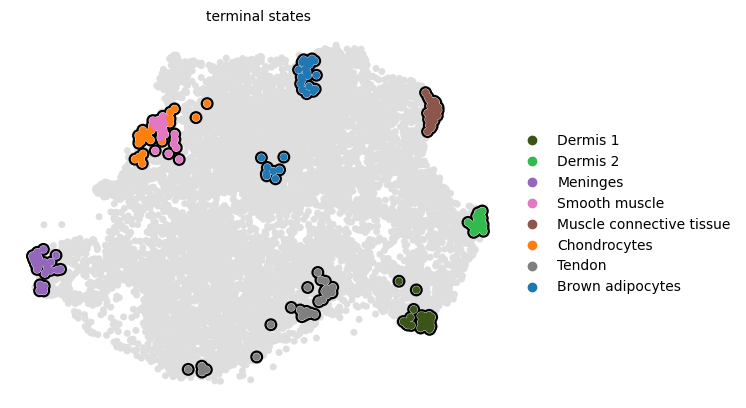

In [16]:
# predict terminal states
g.predict_terminal_states()
g.plot_macrostates(which="terminal", legend_loc="right", s=100)

/opt/anaconda3/envs/single-cell/lib/python3.13/site-packages/scvelo/plotting/scatter.py:656: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  smp = ax.scatter(
/opt/anaconda3/envs/single-cell/lib/python3.13/site-packages/scvelo/plotting/scatter.py:656: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  smp = ax.scatter(


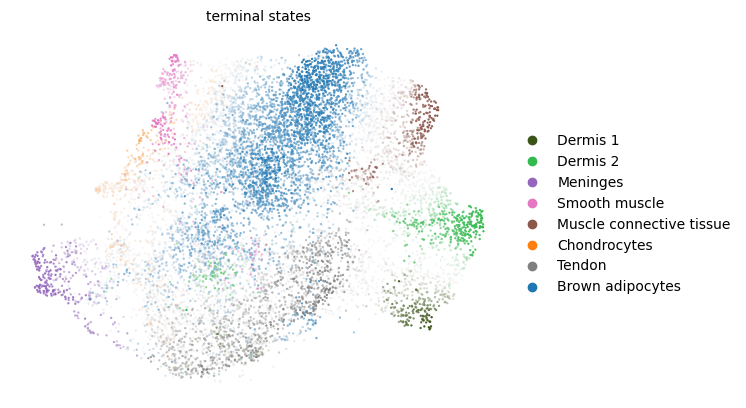

In [17]:
# plot terminal states
g.plot_macrostates(which="terminal", discrete=False, legend_loc='right') # color intensity based on confidence of which lineage a cell belongs to

In [18]:
# uncovering driver genes by correlating fate probabilities and gene expressions
g.compute_fate_probabilities()

driver_clusters = ['Fibroblast progenitors', 'Brown adipocytes', 'Meninges', 'Smooth muscle', 'Muscle connective tissue', 'Chondrocytes', 'Tendon', 'Dermis']

BA_df = g.compute_lineage_drivers(
    lineages=['Brown adipocytes'], cluster_key='cell_type', clusters=driver_clusters
)
BA_df.head(20)

Computing fate probabilities
Defaulting to `'gmres'` solver.


100%|██████████| 8/8 [00:00<00:00, 17.42/s]

Adding `adata.obsm['lineages_fwd']`
       `.fate_probabilities`
    Finish (0:00:00)


Adding `adata.varm['terminal_lineage_drivers']`
       `.lineage_drivers`
    Finish (0:00:01)


,Brown adipocytes_corr,Brown adipocytes_pval,Brown adipocytes_qval,Brown adipocytes_ci_low,Brown adipocytes_ci_high
EBF2,0.499504,0.000000e+00,0.000000e+00,0.485267,0.513476
EBF3,0.454268,0.000000e+00,0.000000e+00,0.439226,0.469056
IGF1,0.427956,0.000000e+00,0.000000e+00,0.412482,0.443184
6330403K07RIK,0.405476,0.000000e+00,0.000000e+00,0.389654,0.421060
PLAGL1,0.402342,0.000000e+00,0.000000e+00,0.386473,0.417974
ANGPTL1,0.370115,0.000000e+00,0.000000e+00,0.353784,0.386221
ITM2A,0.364802,0.000000e+00,0.000000e+00,0.348398,0.380982
MEST,0.360447,0.000000e+00,0.000000e+00,0.343986,0.376687
POSTN,0.359281,0.000000e+00,0.000000e+00,0.342803,0.375537
PTN,0.351049,0.000000e+00,0.000000e+00,0.334464,0.367417


The table headers: correlation values, as well as p-values, multiple-testing corrected q-values, and confidence intervals.

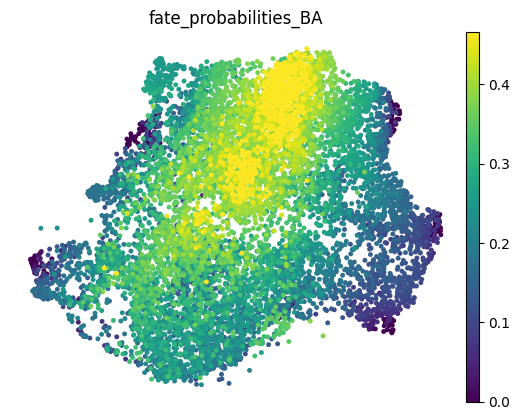

In [19]:
# visualize fate probabilites towards BA cluster
adata_velo.obs["fate_probabilities_BA"] = g.fate_probabilities['Brown adipocytes'].X.flatten()

sc.pl.embedding(
    adata_velo,
    basis="X_umap",
    color=['fate_probabilities_BA'],
    color_map="viridis",
    s=50,
    vmax="p96",
    frameon=False,
)

## VelocityKernel
Just initializing in order to combine kernel, more detailed velocity analysis is done using scvelo, see `scvelo_analysis.ipynb`

In [20]:
# set up the kernel
vk = cr.kernels.VelocityKernel(adata_velo)
vk.compute_transition_matrix()

KeyError: "Unable to find data in `adata.layers['Ms']`."

Projecting transition matrix onto `umap`
Adding `adata.obsm['T_fwd_umap']`
    Finish (0:00:01)


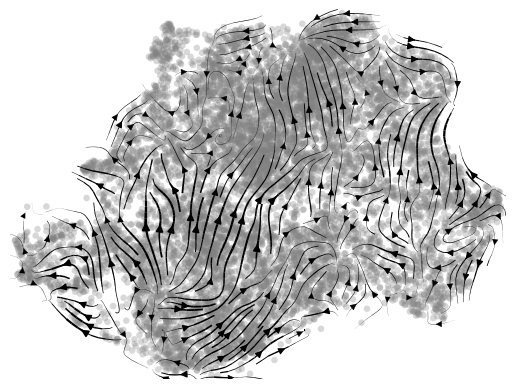

In [22]:
# visualize transition
vk.plot_projection()

Simulating `100` random walks of maximum length `1000`


100%|██████████| 100/100 [00:20<00:00,  4.86sim/s]

    Finish (0:00:20)
Plotting random walks


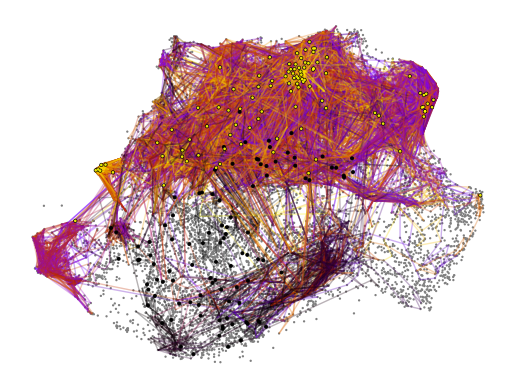

In [23]:
# random walks
vk.plot_random_walks(start_ixs={'cell_type': 'Fibroblast progenitors'}, max_iter=1000, seed=0)

In [24]:
# initialize GPCCA estimator
v = cr.estimators.GPCCA(vk)
print(v)

GPCCA[kernel=VelocityKernel[n=10879], initial_states=None, terminal_states=None]


Computing Schur decomposition
When computing macrostates, choose a number of states NOT in `[7]`
Adding `adata.uns['eigendecomposition_fwd']`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:00)
Computing `10` macrostates
Adding `.macrostates`
       `.macrostates_memberships`
       `.coarse_T`
       `.coarse_initial_distribution
       `.coarse_stationary_distribution`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:05)


/opt/anaconda3/envs/cr/lib/python3.13/site-packages/scvelo/plotting/scatter.py:656: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  smp = ax.scatter(
/opt/anaconda3/envs/cr/lib/python3.13/site-packages/scvelo/plotting/scatter.py:694: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/opt/anaconda3/envs/cr/lib/python3.13/site-packages/scvelo/plotting/utils.py:1396: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(x, y, s=bg_size, marker=".", c=bg_color, zorder=zord - 2, **kwargs)
/opt/anaconda3/envs/cr/lib/python3.13/site-packages/scvelo/plotting/utils.py:1397: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(x, y, s=gp_size, marker=".", c=gp_color, zorder=zord - 1, **kwargs)


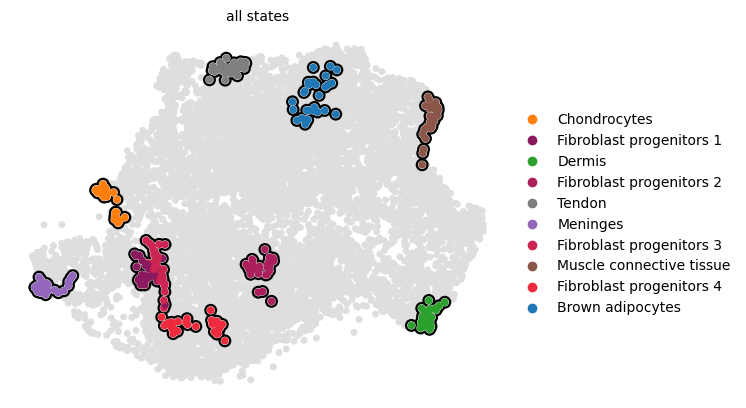

In [25]:
# macrostates
v.compute_macrostates(n_states=10, cluster_key='cell_type')
v.plot_macrostates(which="all", legend_loc="right", s=100)

Adding `adata.obs['term_states_fwd']`
       `adata.obs['term_states_fwd_probs']`
       `.terminal_states`
       `.terminal_states_probabilities`
       `.terminal_states_memberships
    Finish`


/opt/anaconda3/envs/cr/lib/python3.13/site-packages/scvelo/plotting/scatter.py:656: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  smp = ax.scatter(
/opt/anaconda3/envs/cr/lib/python3.13/site-packages/scvelo/plotting/scatter.py:694: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/opt/anaconda3/envs/cr/lib/python3.13/site-packages/scvelo/plotting/utils.py:1396: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(x, y, s=bg_size, marker=".", c=bg_color, zorder=zord - 2, **kwargs)
/opt/anaconda3/envs/cr/lib/python3.13/site-packages/scvelo/plotting/utils.py:1397: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(x, y, s=gp_size, marker=".", c=gp_color, zorder=zord - 1, **kwargs)


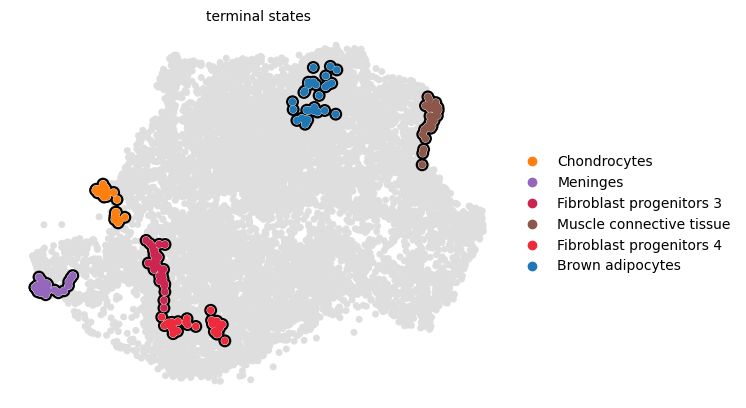

In [26]:
# predict terminal states
v.predict_terminal_states()
v.plot_macrostates(which="terminal", legend_loc="right", s=100)

/opt/anaconda3/envs/cr/lib/python3.13/site-packages/scvelo/plotting/scatter.py:656: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  smp = ax.scatter(
/opt/anaconda3/envs/cr/lib/python3.13/site-packages/scvelo/plotting/scatter.py:656: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  smp = ax.scatter(


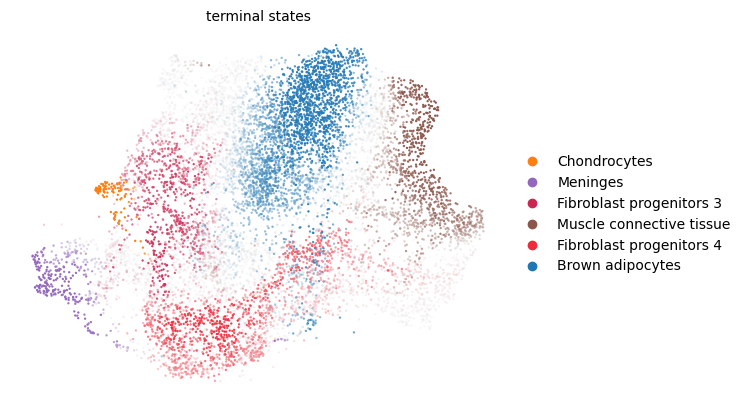

In [27]:
# plot terminal states
v.plot_macrostates(which="terminal", discrete=False, legend_loc='right')

Computing fate probabilities


100%|██████████| 6/6 [00:00<00:00, 22.81/s]

Adding `adata.obsm['lineages_fwd']`
       `.fate_probabilities`
    Finish (0:00:00)


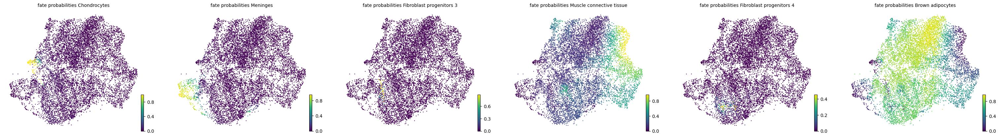

In [28]:
# compute fate prob
v.compute_fate_probabilities()
v.plot_fate_probabilities(same_plot=False)

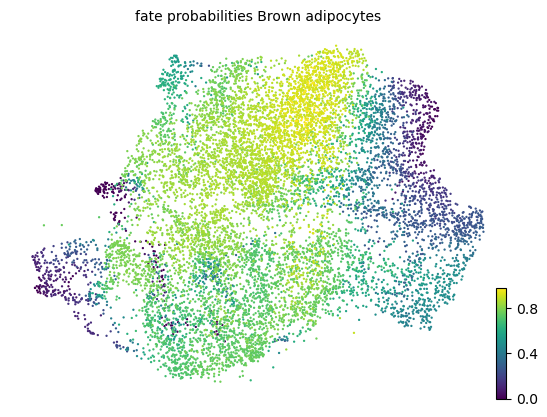

In [29]:
v.plot_fate_probabilities(states=['Brown adipocytes'])

In [30]:
# driver genes
driver_clusters = ['Fibroblast progenitors', 'Brown adipocytes', 'Meninges', 'Smooth muscle', 'Chondrocytes', 'Muscle connective tissue', 'Dermis', 'Tendon']

vk_df = v.compute_lineage_drivers(
    lineages=['Brown adipocytes'], cluster_key='cell_type', clusters=driver_clusters
)
vk_df.head(20)

Adding `adata.varm['terminal_lineage_drivers']`
       `.lineage_drivers`
    Finish (0:00:00)


,Brown adipocytes_corr,Brown adipocytes_pval,Brown adipocytes_qval,Brown adipocytes_ci_low,Brown adipocytes_ci_high
EBF2,0.475112,0.000000e+00,0.000000e+00,0.460431,0.489533
EBF3,0.439736,0.000000e+00,0.000000e+00,0.424452,0.454770
IGF1,0.388304,0.000000e+00,0.000000e+00,0.372228,0.404146
GAS2,0.379833,0.000000e+00,0.000000e+00,0.363637,0.395799
6330403K07RIK,0.340568,1.398452e-299,1.149285e-296,0.323849,0.357074
PTN,0.330097,3.974278e-280,2.889300e-277,0.313248,0.346738
FZD8,0.309135,1.454184e-243,8.329391e-241,0.292040,0.326033
AMOT,0.306101,1.583578e-238,8.803765e-236,0.288971,0.323034
ANGPTL1,0.304445,8.353426e-236,4.511328e-233,0.287297,0.321398
TCF7L2,0.286549,1.453937e-207,6.543407e-205,0.269207,0.303705


## Combined kernels

In [31]:
# combining the two kernels
combined_kernel = 0.5 * vk + 0.5 * tmk

In [32]:
# compute transition matrix with combined kernel
com = combined_kernel.compute_transition_matrix()

In [33]:
# initialize the GPCCA estimator
c = cr.estimators.GPCCA(com)
print(c)

GPCCA[kernel=(0.5 * VelocityKernel[n=10879] + 0.5 * RealTimeKernel[n=10879]), initial_states=None, terminal_states=None]


Computing Schur decomposition
Adding `adata.uns['eigendecomposition_fwd']`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:00)
Calculating minChi criterion in interval `[8, 10]`
Computing `9` macrostates
Adding `.macrostates`
       `.macrostates_memberships`
       `.coarse_T`
       `.coarse_initial_distribution
       `.coarse_stationary_distribution`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:03)


/opt/anaconda3/envs/cr/lib/python3.13/site-packages/scvelo/plotting/scatter.py:656: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  smp = ax.scatter(
/opt/anaconda3/envs/cr/lib/python3.13/site-packages/scvelo/plotting/scatter.py:694: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/opt/anaconda3/envs/cr/lib/python3.13/site-packages/scvelo/plotting/utils.py:1396: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(x, y, s=bg_size, marker=".", c=bg_color, zorder=zord - 2, **kwargs)
/opt/anaconda3/envs/cr/lib/python3.13/site-packages/scvelo/plotting/utils.py:1397: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(x, y, s=gp_size, marker=".", c=gp_color, zorder=zord - 1, **kwargs)


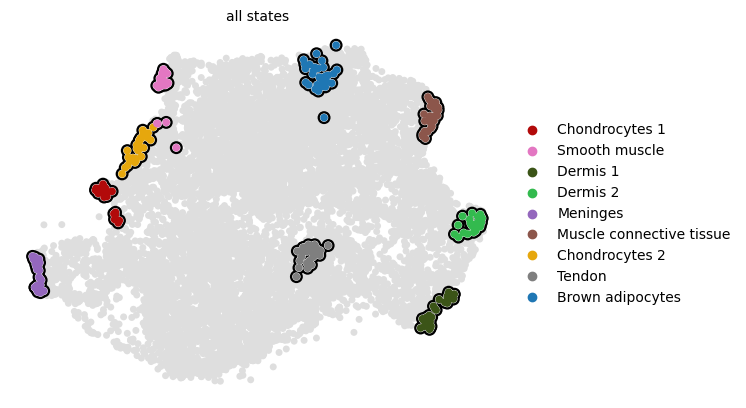

In [34]:
# macrostates
c.fit(cluster_key="cell_type", n_states=[8, 10]) 
c.plot_macrostates(which="all", discrete=True, legend_loc="right", s=100)

Adding `adata.obs['term_states_fwd']`
       `adata.obs['term_states_fwd_probs']`
       `.terminal_states`
       `.terminal_states_probabilities`
       `.terminal_states_memberships
    Finish`


/opt/anaconda3/envs/cr/lib/python3.13/site-packages/scvelo/plotting/scatter.py:656: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  smp = ax.scatter(
/opt/anaconda3/envs/cr/lib/python3.13/site-packages/scvelo/plotting/scatter.py:694: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/opt/anaconda3/envs/cr/lib/python3.13/site-packages/scvelo/plotting/utils.py:1396: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(x, y, s=bg_size, marker=".", c=bg_color, zorder=zord - 2, **kwargs)
/opt/anaconda3/envs/cr/lib/python3.13/site-packages/scvelo/plotting/utils.py:1397: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(x, y, s=gp_size, marker=".", c=gp_color, zorder=zord - 1, **kwargs)


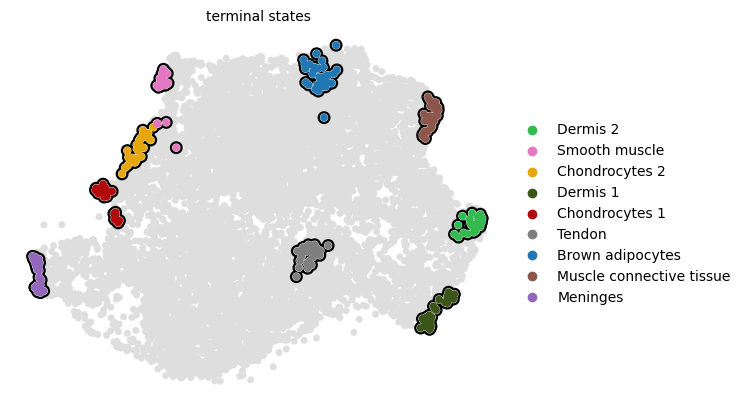

In [35]:
# predict terminal states
c.predict_terminal_states(method="top_n", n_states=10, allow_overlap=True)
c.plot_macrostates(which="terminal", legend_loc="right", s=100)

In [36]:
# set terminal states manually - only one terminal state for chondrocytes
c.set_terminal_states(states=["Brown adipocytes", "Muscle connective tissue", 'Dermis_1', 'Dermis_2', 'Smooth muscle', 'Chondrocytes_1', 'Meninges', 'Tendon'])

Adding `adata.obs['term_states_fwd']`
       `adata.obs['term_states_fwd_probs']`
       `.terminal_states`
       `.terminal_states_probabilities`
       `.terminal_states_memberships
    Finish`


GPCCA[kernel=(0.5 * VelocityKernel[n=10879] + 0.5 * RealTimeKernel[n=10879]), initial_states=None, terminal_states=['Brown adipocytes', 'Chondrocytes_1', 'Dermis_1', 'Dermis_2', 'Meninges', 'Muscle connective tissue', 'Smooth muscle', 'Tendon']]

/opt/anaconda3/envs/cr/lib/python3.13/site-packages/scvelo/plotting/scatter.py:656: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  smp = ax.scatter(
/opt/anaconda3/envs/cr/lib/python3.13/site-packages/scvelo/plotting/scatter.py:694: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/opt/anaconda3/envs/cr/lib/python3.13/site-packages/scvelo/plotting/utils.py:1396: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(x, y, s=bg_size, marker=".", c=bg_color, zorder=zord - 2, **kwargs)
/opt/anaconda3/envs/cr/lib/python3.13/site-packages/scvelo/plotting/utils.py:1397: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(x, y, s=gp_size, marker=".", c=gp_color, zorder=zord - 1, **kwargs)


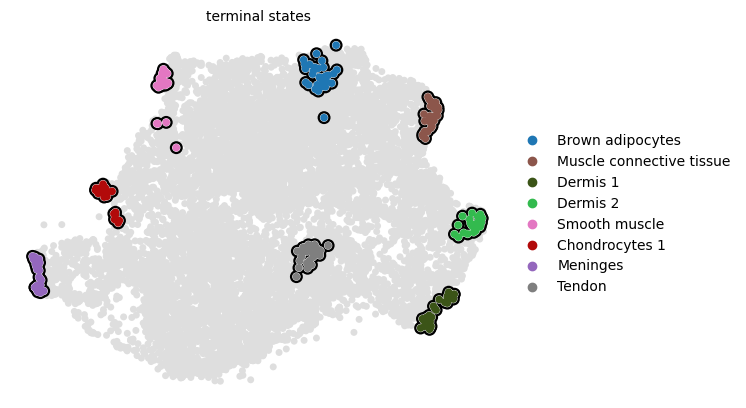

In [37]:
# plot terminal states once more
c.plot_macrostates(which="terminal", legend_loc="right", s=100)

/opt/anaconda3/envs/cr/lib/python3.13/site-packages/scvelo/plotting/scatter.py:656: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  smp = ax.scatter(
/opt/anaconda3/envs/cr/lib/python3.13/site-packages/scvelo/plotting/scatter.py:656: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  smp = ax.scatter(


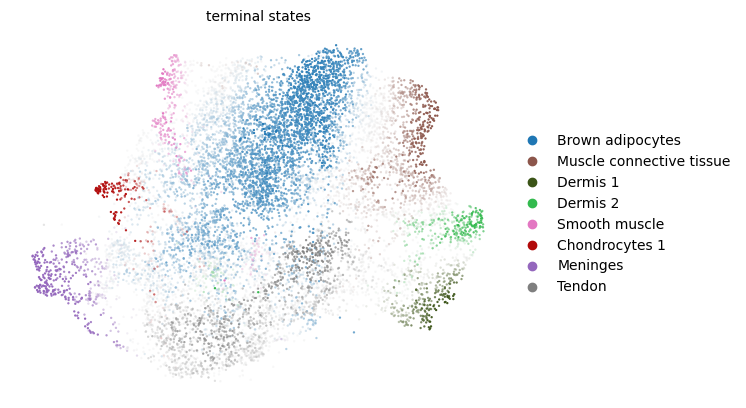

In [38]:
c.plot_macrostates(which="terminal", discrete=False, legend_loc='right')

Computing fate probabilities


100%|██████████| 8/8 [00:00<00:00, 26.17/s]

Adding `adata.obsm['lineages_fwd']`
       `.fate_probabilities`
    Finish (0:00:00)


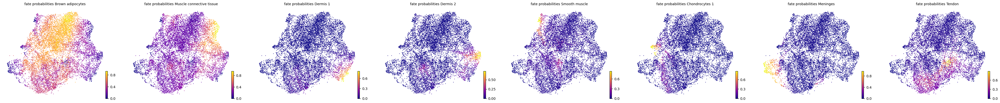

In [39]:
# compute fate probabilities
c.compute_fate_probabilities()
c.plot_fate_probabilities(same_plot=False, cmap='plasma')

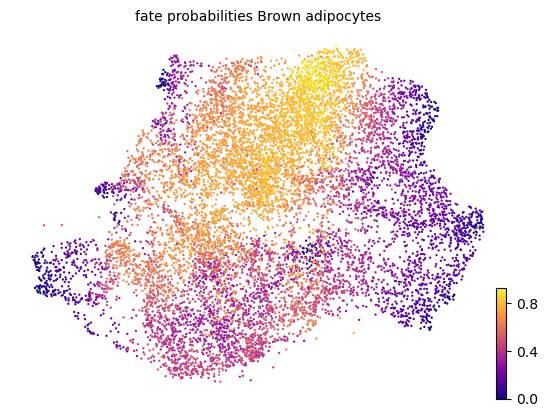

In [40]:
c.plot_fate_probabilities(states=['Brown adipocytes'], cmap='plasma')

In [41]:
# driver genes
driver_clusters = ['Brown adipocytes', 'Fibroblast progenitors', 'Meninges', 'Smooth muscle', 'Tendon', 'Dermis', 'Muscle connective tissue', 'Chondrocytes']

comk = c.compute_lineage_drivers(
    lineages=['Brown adipocytes'], cluster_key='cell_type', clusters=driver_clusters
)
comk.head(20)

comk.to_csv('/Users/rikac/Documents/mansfield_lab/summer_25/results/scvelo/brown_adipoytes_cellrank_driver_genes_ver2.csv')

Adding `adata.varm['terminal_lineage_drivers']`
       `.lineage_drivers`
    Finish (0:00:00)


In [42]:
# viewing gene expressions trends on line plots
# initialize GAM fitting
model = cr.models.GAMR(adata_velo, n_knots=6, smoothing_penalty=10.0)

/opt/anaconda3/envs/cr/lib/python3.13/site-packages/rpy2/rinterface/__init__.py:1185: UserWarning: Environment variable "PWD" redefined by R and overriding existing variable. Current: "/", R: "/Users/rikac/Documents/mansfield_lab/summer_25/codes"
  warnings.warn(
/opt/anaconda3/envs/cr/lib/python3.13/site-packages/rpy2/rinterface/__init__.py:1185: UserWarning: Environment variable "R_SESSION_TMPDIR" redefined by R and overriding existing variable. Current: "/var/folders/py/vj3fjhrx3c3f6dq8h2g1svr80000gn/T//Rtmpr58yXU", R: "/var/folders/py/vj3fjhrx3c3f6dq8h2g1svr80000gn/T//RtmpAPi8Ea"
  warnings.warn(


The model above is a ridge regression model used to smooth gene expression over a time parameter. The model is used to plot gene trends below.

Computing trends using `1` core(s)


100%|████████████████████████████████████████| 80/80 [00:04<00:00, 16.11gene/s]

    Finish (0:00:04)


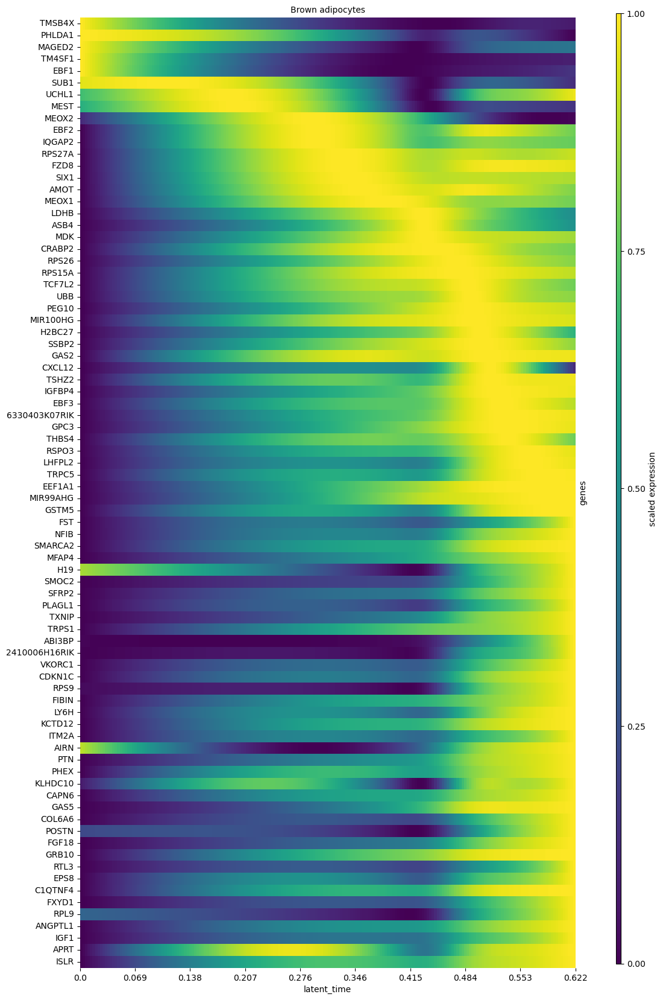

In [43]:
# heatmap of BA of genes from compute_lineage_drivers
cr.pl.heatmap(
    adata_velo,
    model=model,
    lineages="Brown adipocytes",
    #cluster_key="cell_type",
    #show_fate_probabilities=True,
    data_key="Ms",
    genes=comk.head(80).index,
    time_key="latent_time",
    figsize=(12, 20),
    show_all_genes=True,
    weight_threshold=(0, 0)
)